# Variational optimization of continuous matrix product states
## Supplementary material: comparison with Matrix Product States


## Setup

This notebook is an addendu to the notebook arXiv:2006.01801.ipynb and assumes the same setup. The required packages can be installed by uncommenting the following lines.

In [1]:
# import Pkg;
# Pkg.activate()
# Pkg.instantiate()
# Pkg.add(url="https://github.com/Jutho/CMPSKit.jl")

Now, we load these packages, though we restrict to only specific methods or types to be loaded from KrylovKit, OptimKit and Plots.

In [2]:
using CMPSKit
using KrylovKit: Arnoldi, GMRES
using OptimKit: GradientDescent, ConjugateGradient, LBFGS
using JLD2
using Plots: plot, plot!
using IJulia
using LinearAlgebra

For comparing with MPS simulations, we also need to install and load the following packages:

In [3]:
# import Pkg
# Pkg.add("TensorKit","MPSKit","MPSKitModels")
using TensorKit
using MPSKit
using MPSKitModels

## Particles in a box in the Tonks-Girardeau limit

### cMPS and its discretisation into an MPS
We first revisit the cMPS simulation of particles in a box in the Tonks-Girardeau limit (large interaction strength), where we only use chemical potential but no inhomogeneous external potential. We first compare our cMPS results with results obtained from regarding it as an MPS according to the well known correspondence. A comparision with a variationally optimized MPS follows below.

We first define the operators in the continuum.

In [4]:
(a, b) = (0., 1.) # box / interval
μ = (4.75*π)^2 # chemical potential
g = 1e6; # interaction strength

# Local densities:
n̂_continuum = ψ̂'*ψ̂; # particle density operator
k̂_continuum = ∂ψ̂'*∂ψ̂; # kinetic energy density operator
û_continuum = (ψ̂')^2*ψ̂^2; # interaction operator

# Hamiltonian
Ĥ₁_continuum = ∫(k̂_continuum - μ * n̂_continuum + g * û_continuum, (a, b));

We now load the variationally obtained cMPS ground state approximation for this Hamiltonian, and recompute its properties.

In [5]:
@load "FiniteCMPS_D=8_mu=223_g=1e6.jld" Ψ

D = 8
ρL_cMPS, ρR_cMPS, = environments!(Ψ; tol = 1e-14)
particle_density_cMPS = expval(n̂_continuum, Ψ, ρL_cMPS, ρR_cMPS)
kinetic_energy_density_cMPS = expval(k̂_continuum, Ψ, ρL_cMPS, ρR_cMPS)
interaction_energy_density_cMPS = expval(g*û_continuum, Ψ, ρL_cMPS, ρR_cMPS);
energy_density_cMPS = kinetic_energy_density_cMPS - μ * particle_density_cMPS + interaction_energy_density_cMPS;
energy_cMPS = integrate(energy_density_cMPS, (a,b))
particle_number_cMPS = integrate(particle_density_cMPS, (a,b))

(energy_cMPS, particle_number_cMPS)

(-594.4455915858346, 3.9998806469359605)

This cMPS uses a piecewise linear representation of the $Q$ and $R$ matrix on a grid with spacing $\epsilon = 1/32$. We now build a lattice discretisation of this Hamiltonian. Working with the same boundary conditions corresponds to having no particles at the boundaries, which is equivalent to having a state which is non-trivial only at the 31 bulk points at position `x = (1:31)/32`. We furthermore truncate the number of particles on a given site to `mode_cutoff = 5` and use an otherwise naive discretisation of the different continuum operators. The density and interaction potential become onsite operators. The kinetic energy becomes a nearest neighbour operator, which is best associated with the interval between two neighbouring sites, and where we take into account that there is an extra empty site on either boundary.

In [6]:
M = 31 # number of lattice points in the interval (a,b), with coordinates a + (i/M+1)*(b-a) for i = 1:M
ϵ = (b-a)/(M+1) # associated lattice spacing
mode_cutoff = 5 # number of bosonic modes
(c⁺,c⁻) = nonsym_bosonictensors(mode_cutoff)

n̂_lattice = c⁺*c⁻ / ϵ
û_lattice = c⁺*c⁺*c⁻*c⁻ / ϵ^2
i = one(c⁺)
k̂_lattice = (c⁺ ⊗ i - i ⊗ c⁺) * (c⁻ ⊗ i - i ⊗ c⁻) / ϵ^3
k̂_lattice_boundary = c⁺*c⁻ / ϵ^3;

At first, we build an MPS by applying the standard prescription $A^0 = 1 + \epsilon Q$ and $A^k = \frac{(\sqrt{\epsilon} R)^k}{\sqrt{k!}}$ on this grid. We also have to take into account the effect of the cMPS boundary which is specified by the choice of $v_L$ and $v_R$, both of which were chosen as the standard unit vector along the first dimension.

In [7]:
MPSgrid = a .+ ϵ .* (1:M)
Qmats = Ψ.Q.(MPSgrid)
Rmats = Ψ.Rs[1].(MPSgrid)
d = mode_cutoff + 1
Amats = map(Qmats, Rmats) do Q, R
    reshape(vcat(one(Q) + ϵ*Q, (sqrt(ϵ)^k * R^k/sqrt(factorial(k)) for k=1:mode_cutoff)...), (D, d, D))
end
# implement cMPS boundary conditions resulting from `vL` and `vR`
Amats[1] = reshape(Ψ.vL' * reshape(Amats[1], (D, d*D)), (1, d, D))
Amats[M] = reshape(reshape(Amats[M], D*d, D) * Ψ.vR, (D, d, 1))
As = map(Amats) do A
    Dl, d, Dr = size(A)
    TensorMap(A, ℂ^Dl ⊗ ℂ^d, ℂ^Dr)
end
ΨMPS = FiniteMPS(As; normalize = true);

particle_density_MPS = real(expectation_value(ΨMPS, n̂_lattice))
interaction_energy_density_MPS = real(expectation_value(ΨMPS, g*û_lattice))
kinetic_energy_density_MPS = real([expectation_value(ΨMPS, k̂_lattice_boundary, 1);
                                    [expectation_value(ΨMPS, k̂_lattice, i) for i = 1:M-1];
                                    expectation_value(ΨMPS, k̂_lattice_boundary, M)])
MPS_kinetic_grid = a .+ ϵ .* ((1:M+1) .- 0.5)

energy_density_MPS = (kinetic_energy_density_MPS[2:end] + kinetic_energy_density_MPS[1:end-1])/2 - μ * particle_density_MPS + interaction_energy_density_MPS
energy_MPS = ϵ * (sum(kinetic_energy_density_MPS) - μ * sum(particle_density_MPS) + sum(interaction_energy_density_MPS))
particle_number_MPS = ϵ * sum(particle_density_MPS)
(energy_MPS, particle_number_MPS)

(-437.76930601327706, 3.9643935353488047)

That is pretty far off the cMPS result. Let us visualize these results.

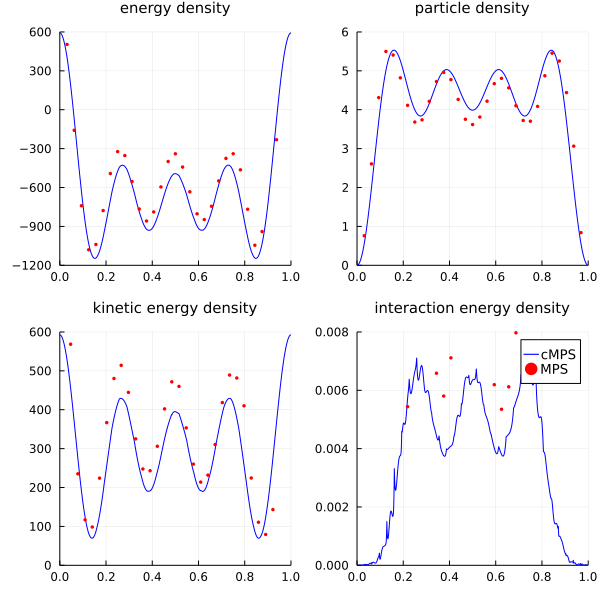

In [8]:
cMPS_plotgrid = 0:1/3200:1
p1 = plot(cMPS_plotgrid, energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (-1200, 600), title = "energy density")
plot!(p1, MPSgrid, energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p2 = plot(cMPS_plotgrid, particle_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,6), title = "particle density")
plot!(p2, MPSgrid, particle_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p3 = plot(cMPS_plotgrid, kinetic_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,600), title = "kinetic energy density")
plot!(p3, MPS_kinetic_grid, kinetic_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p4 = plot(cMPS_plotgrid, interaction_energy_density_cMPS.(cMPS_plotgrid), label = "cMPS", linecolor = :blue, xlims = (0,1), ylims = (0, 8e-3), title = "interaction energy density")
plot!(p4, MPSgrid, interaction_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "MPS")
plot(p1, p2, p3, p4, layout = (2,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9, size = (600, 600))

The specific grid on which the cMPS matrices were parameterized as piecewise linear functions has no particular relevance to the lattice discretisation. The cMPS is defined everywhere in the continuum. So we can also apply the same construction to extract an MPS on a much finer grid, which should then provide a more accurate approximation to the cMPS.

In [9]:
M′ = 3199 # number of lattice points in the interval (a,b), with coordinates a + (i/M+1)*(b-a) for i = 1:M
ϵ′ = (b-a)/(M′+1) # associated lattice spacing
n̂_lattice′ = c⁺*c⁻ / ϵ′
û_lattice′ = c⁺*c⁺*c⁻*c⁻ / ϵ′^2
k̂_lattice′ = (c⁺ ⊗ i - i ⊗ c⁺) * (c⁻ ⊗ i - i ⊗ c⁻) / ϵ′^3
k̂_lattice_boundary′ = c⁺*c⁻ / ϵ′^3

MPSgrid′ = a .+ ϵ′ .* (1:M′)
Qmats′ = Ψ.Q.(MPSgrid′)
Rmats′ = Ψ.Rs[1].(MPSgrid′)
Amats′ = map(Qmats′, Rmats′) do Q, R
     reshape(vcat(one(Q) + ϵ′*Q, (sqrt(ϵ′)^k * R^k/sqrt(factorial(k)) for k=1:mode_cutoff)...), (D, d, D))
end
# implement cMPS boundary conditions resulting from `vL` and `vR`
Amats′[1] = reshape(Ψ.vL' * reshape(Amats′[1], (D, d*D)), (1, d, D))
Amats′[M′] = reshape(reshape(Amats′[M′], D*d, D) * Ψ.vR, (D, d, 1))
As′ = map(Amats′) do A
    Dl, d, Dr = size(A)
    TensorMap(A, ℂ^Dl ⊗ ℂ^d, ℂ^Dr)
end
ΨMPS′ = FiniteMPS(As′; normalize = true);

particle_density_MPS′ = real(expectation_value(ΨMPS′, n̂_lattice′))
interaction_energy_density_MPS′ = real(expectation_value(ΨMPS′, g*û_lattice′))
kinetic_energy_density_MPS′ = real([expectation_value(ΨMPS′, k̂_lattice_boundary′, 1);
                                    [expectation_value(ΨMPS′, k̂_lattice′, i) for i = 1:M′-1];
                                    expectation_value(ΨMPS′, k̂_lattice_boundary′, M′)]);
MPS_kinetic_grid′ = a .+ ϵ′ .* ((1:M′+1) .- 0.5)

energy_density_MPS′ = (kinetic_energy_density_MPS′[2:end] + kinetic_energy_density_MPS′[1:end-1])/2 - μ * particle_density_MPS′ + interaction_energy_density_MPS′
energy_MPS′ = ϵ′ * (sum(kinetic_energy_density_MPS′) - μ * sum(particle_density_MPS′) + sum(interaction_energy_density_MPS′))
particle_number_MPS′ = ϵ′ * sum(particle_density_MPS′)
(energy_MPS′, particle_number_MPS′)

(-593.8678910723477, 3.999876673368931)

This is approximating the exact cMPS values much better. Let's again visualize the result.

In [10]:
cMPS_plotgrid = 0:1/3200:1
p1 = plot(cMPS_plotgrid, energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (-1200, 600), title = "energy density")
plot!(p1, MPSgrid′, energy_density_MPS′, seriestype = :scatter, markersize = 1, markercolor = :red, markerstrokewidth = 0, label = "")
p2 = plot(cMPS_plotgrid, particle_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,6), title = "particle density")
plot!(p2, MPSgrid′, particle_density_MPS′, seriestype = :scatter, markersize = 1, markercolor = :red, markerstrokewidth = 0, label = "")
p3 = plot(cMPS_plotgrid, kinetic_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,600), title = "kinetic energy density")
plot!(p3, MPS_kinetic_grid′, kinetic_energy_density_MPS′, seriestype = :scatter, markersize = 1, markercolor = :red, markerstrokewidth = 0, label = "")
p4 = plot(cMPS_plotgrid, interaction_energy_density_cMPS.(cMPS_plotgrid), label = "cMPS", linecolor = :blue, xlims = (0,1), ylims = (0, 8e-3), title = "interaction energy density")
plot!(p4, MPSgrid′, interaction_energy_density_MPS′, seriestype = :scatter, markersize = 1, markercolor = :red, markerstrokewidth = 0, label = "MPS")
plot(p1, p2, p3, p4, layout = (2,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9, size = (600, 600))

In this case, the expectation values from the cMPS and its discretisation into a MPS match very well. There are some small discrepencies near the boundaries, which are most notable in the interaction energy. Before discussing these, note that in the middle region the MPS captures the fine and irregular details in the cMPS expectation value of the interaction energy, which occur within a single interval of the piecewise linear model for the cMPS matrices. This illustrates that these features are not inaccuracies in computing the cMPS expectation values, but artefacts of the piecewise linear model for the matrices $Q(x)$ and $R(x)$, in combination with the high power thereof appearing in the interaction energy.

Regarding the boundaries, the discrepancies can be attributed to accumulated differences in the MPS and cMPS environments $\rho_L$ and $\rho_R$. The cMPS environments are determined by a Lindblad equation in terms of the matrices $Q(x)$ and $R(x)$. The equation that determines the MPS environments can be recognized as a first order Euler scheme for integrating this differential equation (it contains higher order terms, but not all the terms necessary to really represent a higher order Euler scheme). We can verify this explicitly by computing the difference between the MPS and cMPS environments, where we associate the MPS environments with a position halfway in between the sites.

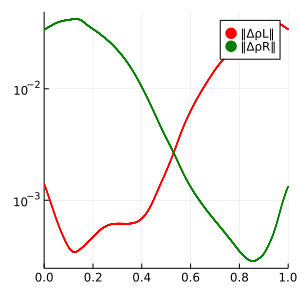

In [11]:
ρLs′ = [ones(Float64, (1,1))]
for i = 1:M′
    @tensor ρL′[-1;-2] := conj(Amats′[i][1,3,-1])*ρLs′[i][1,2]*Amats′[i][2,3,-2]
    push!(ρLs′, ρL′)
end
ρRs′ = [ones(Float64, (1,1))]
for i = M′:-1:1
    @tensor ρR′[-1;-2] := Amats′[i][-1,3,1]*ρRs′[1][1,2]*conj(Amats′[i][-2,3,2])
    pushfirst!(ρRs′, ρR′)
end
ρ′grid = a .+ ϵ′ .* ((2:M′) .- 0.5)
p = plot(ρ′grid, norm.(ρLs′[2:M′] .- ρL_cMPS.(ρ′grid)), label = "‖ΔρL‖", seriestype = :scatter, markersize = 1, markercolor = :red, markerstrokewidth = 0, xlim = (0,1), size = (300, 300), yscale = :log10)
plot!(p, ρ′grid, norm.(ρRs′[2:M′] .- ρR_cMPS.(ρ′grid)), label = "‖ΔρR‖", seriestype = :scatter, markersize = 1, markercolor = :green, markerstrokewidth = 0)

Hence, we observe that $\rho_L$, which is determined from left to right, starts to deviate more strongly near the right boundary, whereas the opposite situation presents itself for $\rho_R$. As both environments appear in the computation of expectation values of local observables, discrepancies can be expected on both sides, and are expected to be most accurate in the middle of the interval.

### Variational cMPS versus variational MPS
We now compare our cMPS results with results from a variationally optimized MPS for the discretized Hamiltonian.

We first compute an MPS on the grid corresponding to that which defines the piecewise linear functions of our cMPS matrices. This gives an idea of how well an MPS with roughly the same number of parameters compares to the cMPS. Strictly speaking, though, the MPS has more parameters, as the different matrices associated with different occupation numbers per site are independent.

We now build the Hamiltonian (as a matrix product operator) and use the MPS obtained from the cMPS as initial guess to start the variational optimization.

In [12]:
Ĥ₁_lattice = let
    data = Array{Any,3}(missing, M, 4, 4);
    data[:,1,1] .= 1.0;
    data[:,end,end] .= 1.0;

    for i in 1:M
        data[i,1,2] = -1/ϵ^2 * c⁺
        data[i,1,3] = -1/ϵ^2 * c⁻
        data[i,2,4] = c⁻
        data[i,3,4] = c⁺
        data[i,1,4] = (-μ + 2/ϵ^2) * (c⁺*c⁻) + (g/ϵ) * (c⁺*c⁺*c⁻*c⁻)
    end

    MPOHamiltonian(data)
end
sum(expectation_value(ΨMPS, Ĥ₁_lattice))

-437.76930601325313

We optimize this MPS using the one-site DMRG algorithm. Note that a lot of code needs to be compiled, so it takes a while before this starts.

In [13]:
ΨMPS, MPS_environments, = find_groundstate!(ΨMPS, Ĥ₁_lattice, Dmrg(; maxiter = 30))

particle_density_MPS = real(expectation_value(ΨMPS, n̂_lattice))
interaction_energy_density_MPS = real(expectation_value(ΨMPS, g*û_lattice))
kinetic_energy_density_MPS = real([expectation_value(ΨMPS, k̂_lattice_boundary, 1);
                                    [expectation_value(ΨMPS, k̂_lattice, i) for i = 1:M-1];
                                    expectation_value(ΨMPS, k̂_lattice_boundary, M)])
MPS_kinetic_grid = a .+ ϵ .* ((1:M+1) .- 0.5)

energy_density_MPS = (kinetic_energy_density_MPS[2:end] + kinetic_energy_density_MPS[1:end-1])/2 - μ * particle_density_MPS + interaction_energy_density_MPS
energy_MPS = ϵ * (sum(kinetic_energy_density_MPS) - μ * sum(particle_density_MPS) + sum(interaction_energy_density_MPS))
particle_number_MPS = ϵ * sum(particle_density_MPS)
(energy_MPS, particle_number_MPS)

┌ Info: Iteraton 0 error 6156.726242118548
└ @ MPSKit /Users/jutho/.julia/dev/MPSKit/src/algorithms/groundstate/dmrg.jl:28
┌ Info: Iteraton 1 error 16.736284620378807
└ @ MPSKit /Users/jutho/.julia/dev/MPSKit/src/algorithms/groundstate/dmrg.jl:28
┌ Info: Iteraton 2 error 1.651169485864101
└ @ MPSKit /Users/jutho/.julia/dev/MPSKit/src/algorithms/groundstate/dmrg.jl:28
┌ Info: Iteraton 3 error 0.6511223968356447
└ @ MPSKit /Users/jutho/.julia/dev/MPSKit/src/algorithms/groundstate/dmrg.jl:28
┌ Info: Iteraton 4 error 0.2790939838849087
└ @ MPSKit /Users/jutho/.julia/dev/MPSKit/src/algorithms/groundstate/dmrg.jl:28
┌ Info: Iteraton 5 error 0.12020871740122453
└ @ MPSKit /Users/jutho/.julia/dev/MPSKit/src/algorithms/groundstate/dmrg.jl:28
┌ Info: Iteraton 6 error 0.05255416259865402
└ @ MPSKit /Users/jutho/.julia/dev/MPSKit/src/algorithms/groundstate/dmrg.jl:28
┌ Info: Iteraton 7 error 0.023338716084498806
└ @ MPSKit /Users/jutho/.julia/dev/MPSKit/src/algorithms/groundstate/dmrg.jl:28
┌ Info

(-597.3526187837936, 3.999967940883642)

We now visualize the results, where we in addition also compute and compare the entanglement spectra and the resulting bipartite entanglement entropy of the MPS and cMPS.

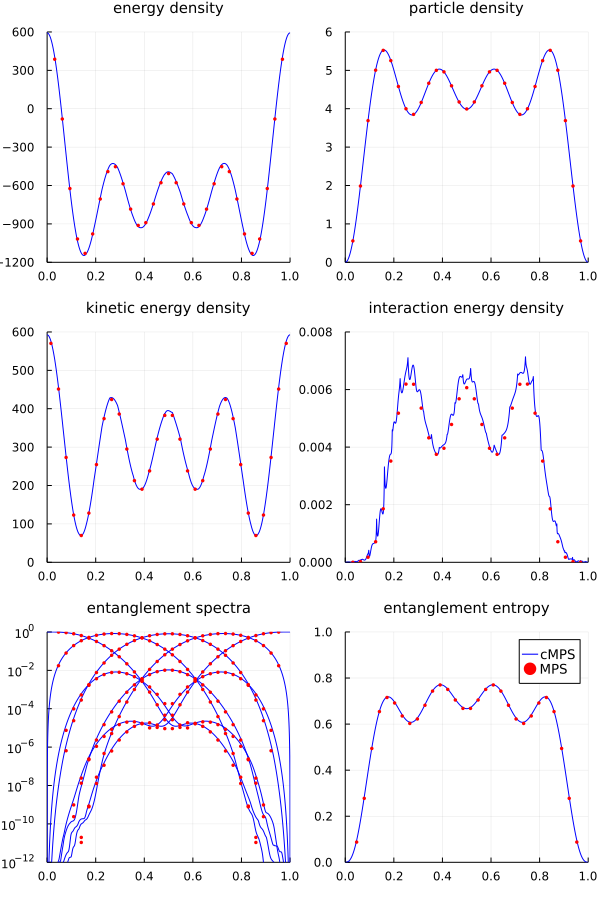

In [14]:
p1 = plot(cMPS_plotgrid, energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (-1200, 600), title = "energy density")
plot!(p1, MPSgrid, energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p2 = plot(cMPS_plotgrid, particle_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,6), title = "particle density")
plot!(p2, MPSgrid, particle_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p3 = plot(cMPS_plotgrid, kinetic_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,600), title = "kinetic energy density")
plot!(p3, MPS_kinetic_grid, kinetic_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p4 = plot(cMPS_plotgrid, interaction_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0, 8e-3), title = "interaction energy density")
plot!(p4, MPSgrid, interaction_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")

entanglement_grid_cMPS = 0:1/3200:1
spectra_cMPS = sort.(real.(eigvals.((ρL_cMPS*ρR_cMPS).(entanglement_grid_cMPS))), rev=true)
spectra_reorganized_cMPS = [collect(abs(s[i]) for s in spectra_cMPS) for i = 1:D];


entanglement_grid_MPS = a .+ ϵ .* ((2:M) .- 0.5)
spectra_MPS = [diag((tsvd(c)[2].data .^2)) for c in [ΨMPS.CR[k] for k in 1:M-1]]
spectra_reorganized_MPS = [collect(abs(i > length(s) ? eps() : s[i]) for s in spectra_MPS) for i = 1:D]

entropy(spectrum) = sum(-abs(p)*log(abs(p)) for p in spectrum)

p5 = plot(entanglement_grid_cMPS, spectra_reorganized_cMPS, linecolor = :blue, yscale = :log10, label="", xlim = (0,1), ylim = (1e-12,1), title = "entanglement spectra")
plot!(p5, entanglement_grid_MPS, spectra_reorganized_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, yscale = :log10, label="")
p6 = plot(entanglement_grid_cMPS, entropy.(spectra_cMPS), linecolor = :blue, xlim = (0,1), ylim = (0, 1), label="cMPS", title = "entanglement entropy")
plot!(p6, entanglement_grid_MPS, entropy.(spectra_MPS), seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label="MPS")

plot(p1, p2, p3, p4, p5, p6, layout = (3,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9, size = (600, 900))

The agreement is now very good. Note that the energy of the discretised Hamiltonian is not an upper bound to that of the continuum Hamiltonian: the variational MPS has a lower energy than the continuum energy.

For completeness, we also compare the cMPS to a variational MPS obtained at a finer grid with `M = 200` sites:

In [15]:
@load "FiniteMPS_tensors_D=8_mu=223_g=1e6.jld" ALs
ΨMPS = FiniteMPS(ALs)

M = length(ΨMPS) # number of lattice points in the interval (a,b), with coordinates a + (i/M+1)*(b-a) for i = 1:M
ϵ = (b-a)/(M+1) # associated lattice spacing

n̂_lattice = c⁺*c⁻ / ϵ
û_lattice = c⁺*c⁺*c⁻*c⁻ / ϵ^2
i = one(c⁺)
k̂_lattice = (c⁺ ⊗ i - i ⊗ c⁺) * (c⁻ ⊗ i - i ⊗ c⁻) / ϵ^3
k̂_lattice_boundary = c⁺*c⁻ / ϵ^3;

MPSgrid = a .+ ϵ .* (1:M)
particle_density_MPS = real(expectation_value(ΨMPS, n̂_lattice))
interaction_energy_density_MPS = real(expectation_value(ΨMPS, g*û_lattice))
kinetic_energy_density_MPS = real([expectation_value(ΨMPS, k̂_lattice_boundary, 1);
                                    [expectation_value(ΨMPS, k̂_lattice, i) for i = 1:M-1];
                                    expectation_value(ΨMPS, k̂_lattice_boundary, M)])
MPS_kinetic_grid = a .+ ϵ .* ((1:M+1) .- 0.5)

energy_density_MPS = (kinetic_energy_density_MPS[2:end] + kinetic_energy_density_MPS[1:end-1])/2 - μ * particle_density_MPS + interaction_energy_density_MPS
energy_MPS = ϵ * (sum(kinetic_energy_density_MPS) - μ * sum(particle_density_MPS) + sum(interaction_energy_density_MPS))
particle_number_MPS = ϵ * sum(particle_density_MPS)
(energy_MPS, particle_number_MPS)

(-594.7183329475644, 3.9999999999999654)

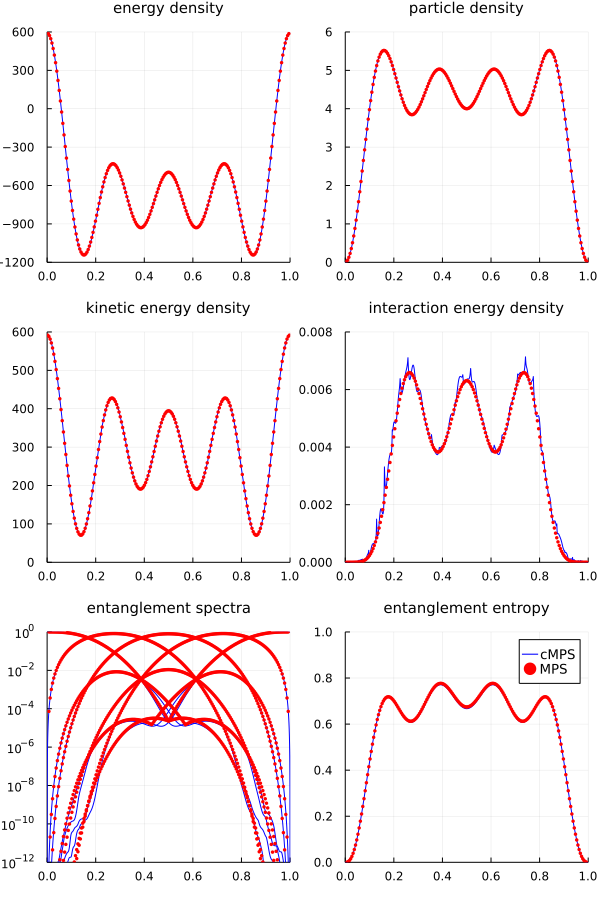

In [16]:
p1 = plot(cMPS_plotgrid, energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (-1200, 600), title = "energy density")
plot!(p1, MPSgrid, energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p2 = plot(cMPS_plotgrid, particle_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,6), title = "particle density")
plot!(p2, MPSgrid, particle_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p3 = plot(cMPS_plotgrid, kinetic_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0,600), title = "kinetic energy density")
plot!(p3, MPS_kinetic_grid, kinetic_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p4 = plot(cMPS_plotgrid, interaction_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0, 8e-3), title = "interaction energy density")
plot!(p4, MPSgrid, interaction_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")

entanglement_grid_MPS = a .+ ϵ .* ((2:M) .- 0.5)
spectra_MPS = [diag((tsvd(c)[2].data .^2)) for c in [ΨMPS.CR[k] for k in 1:M-1]]
spectra_reorganized_MPS = [collect(abs(i > length(s) ? eps() : s[i]) for s in spectra_MPS) for i = 1:D]

entropy(spectrum) = sum(-abs(p)*log(abs(p)) for p in spectrum)

p5 = plot(entanglement_grid_cMPS, spectra_reorganized_cMPS, linecolor = :blue, yscale = :log10, label="", xlim = (0,1), ylim = (1e-12,1), title = "entanglement spectra")
plot!(p5, entanglement_grid_MPS, spectra_reorganized_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, yscale = :log10, label="")
p6 = plot(entanglement_grid_cMPS, entropy.(spectra_cMPS), linecolor = :blue, xlim = (0,1), ylim = (0, 1), label="cMPS", title = "entanglement entropy")
plot!(p6, entanglement_grid_MPS, entropy.(spectra_MPS), seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label="MPS")

plot(p1, p2, p3, p4, p5, p6, layout = (3,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9, size = (600, 900))

Hence, the cMPS with much less parameters can easily reproduce the smooth behaviour of energy and particle densities, as well as of the entanglement structure. Only the interaction energy (which is very small and thus contributes little to the total energy) is less smooth for the cMPS, as discussed above.

## Inhomogeneous potential

We now study problems with an inhomogeneous potential $V(x)$. We hereto define a new Hamiltonian $\hat{H}_2$.

In [17]:
μ = 1749.
g = 35.
V(x) = sin(15*π*x)
grid = 0:1/100:1
v = CMPSKit.Piecewise(grid, [fit(V, TaylorSeries, (grid[i],grid[i+1])) for i in 1:length(grid)-1])
Ĥ₂_continuum = ∫(k̂_continuum  + μ*(v - one(v)) * n̂_continuum + g * û_continuum, (a, b));

We load the variationally optimized cMPS for this potential. Note that we only study the most extreme case of $v_3(x)$ the periodic potential does itself have a prefactor $\mu$. In this case the discrepency between the cMPS results and the LDA/Bethe ansatz results where the largest.

In [18]:
D = 32 # bond dimension
T = Float64 # scalar type

@load "FiniteCMPS_D=32_mu=1749_g=35_v=1749sin.jld" Ψ
ρL_cMPS, ρR_cMPS, = environments!(Ψ)
energy_density_cMPS = expval(Ĥ₂_continuum.h, Ψ, ρL_cMPS, ρR_cMPS)
E_cMPS = ∫(energy_density_cMPS, (a, b))
kinetic_energy_density_cMPS = expval(k̂_continuum, Ψ, ρL_cMPS, ρR_cMPS)
interaction_energy_density_cMPS = expval(g * û_continuum, Ψ, ρL_cMPS, ρR_cMPS)
particle_density_cMPS = expval(n̂_continuum, Ψ, ρL_cMPS, ρR_cMPS)
N_cMPS = ∫(particle_density_cMPS, (a, b))
potential_energy_density_cMPS = μ*(v - one(v)) * particle_density_cMPS;
(E_cMPS, N_cMPS)

(-39525.80004535005, 32.99988071770909)

We now compare the cMPS results to a variationally obtained MPS result, where the MPS has the same bond dimension $D=32$, and is defined on a grid of 200 sites. For convenience, we have computed this MPS ground state approximation and load it from disk.

In [19]:
@load "FiniteMPS_tensors_D=32_mu=1749_g=35_v=1749sin.jld" ALs
ΨMPS = FiniteMPS(ALs)

M = length(ΨMPS) # number of lattice points in the interval (a,b), with coordinates a + (i/M+1)*(b-a) for i = 1:M
ϵ = (b-a)/(M+1) # associated lattice spacing
MPSgrid = a .+ ϵ .* (1:M)
mode_cutoff = 5 # number of bosonic modes
(c⁺,c⁻) = nonsym_bosonictensors(mode_cutoff)

n̂_lattice = c⁺*c⁻ / ϵ
û_lattice = c⁺*c⁺*c⁻*c⁻ / ϵ^2
k̂_lattice = (c⁺ ⊗ i - i ⊗ c⁺) * (c⁻ ⊗ i - i ⊗ c⁻) / ϵ^3
k̂_lattice_boundary = c⁺*c⁻ / ϵ^3;

particle_density_MPS = real(expectation_value(ΨMPS, n̂_lattice))
potential_energy_density_MPS = μ .* (V.(MPSgrid) .- 1) .* particle_density_MPS
interaction_energy_density_MPS = real(expectation_value(ΨMPS, g*û_lattice))
kinetic_energy_density_MPS = real([expectation_value(ΨMPS, k̂_lattice_boundary, 1);
                                    [expectation_value(ΨMPS, k̂_lattice, i) for i = 1:M-1];
                                    expectation_value(ΨMPS, k̂_lattice_boundary, M)])
MPS_kinetic_grid = a .+ ϵ .* ((1:M+1) .- 0.5)

energy_density_MPS = (kinetic_energy_density_MPS[2:end] + kinetic_energy_density_MPS[1:end-1])/2 +
                        potential_energy_density_MPS + interaction_energy_density_MPS
energy_MPS = ϵ * (sum(kinetic_energy_density_MPS) + sum(potential_energy_density_MPS) + sum(interaction_energy_density_MPS))
particle_number_MPS = ϵ * sum(particle_density_MPS)
(energy_MPS, particle_number_MPS)


(-39515.868383327186, 32.999920593645875)

In [20]:
p1 = plot(cMPS_plotgrid, energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (-15e4, 5e4), yticks = ([-15e4,-10e4,-5e4,0,5e4],["-15×10⁴","-10×10⁴","-5×10⁴","0","+5×10⁴"]), title = "total energy density")
plot!(p1, MPSgrid, energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p2 = plot(cMPS_plotgrid, potential_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (-20e4, 0), yticks = ([-20e4, -15e4,-10e4,-5e4,0],["-20×10⁴","-15×10⁴","-10×10⁴","-5×10⁴","0"]), title = "potential energy density")
plot!(p2, MPSgrid, potential_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p3 = plot(cMPS_plotgrid, kinetic_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0e4, 2e4), yticks = ([0e4, 1e4, 2e4],["0","+1×10⁴","+2×10⁴"]), title = "kinetic energy density")
plot!(p3, MPS_kinetic_grid, kinetic_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p4 = plot(cMPS_plotgrid, interaction_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0e4, 8e4), yticks = ([0e4, 2e4, 4e4, 6e4, 8e4],["0","+2×10⁴","+4×10⁴","+6×10⁴","+8×10⁴"]), title = "interaction energy density")
plot!(p4, MPSgrid, interaction_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")

entanglement_grid_cMPS = 0:1/3200:1
spectra_cMPS = sort.(real.(eigvals.((ρL_cMPS*ρR_cMPS).(entanglement_grid_cMPS))), rev=true)
spectra_reorganized_cMPS = [collect(abs(s[i]) for s in spectra_cMPS) for i = 1:D];


entanglement_grid_MPS = a .+ ϵ .* ((2:M) .- 0.5)
spectra_MPS = [diag((tsvd(c)[2].data .^2)) for c in [ΨMPS.CR[k] for k in 1:M-1]]
spectra_reorganized_MPS = [collect(abs(i > length(s) ? eps() : s[i]) for s in spectra_MPS) for i = 1:D]

entropy(spectrum) = sum(-abs(p)*log(abs(p)) for p in spectrum)

p5 = plot(entanglement_grid_cMPS, spectra_reorganized_cMPS, linecolor = :blue, yscale = :log10, label="", xlim = (0,1), ylim = (1e-12,1), title = "entanglement spectra")
plot!(p5, entanglement_grid_MPS, spectra_reorganized_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, yscale = :log10, label="")
p6 = plot(entanglement_grid_cMPS, entropy.(spectra_cMPS), linecolor = :blue, xlim = (0,1), ylim = (0, 2), label="cMPS", title = "entanglement entropy")
plot!(p6, entanglement_grid_MPS, entropy.(spectra_MPS), seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label="MPS")

plot(p1, p2, p3, p4, p5, p6, layout = (3,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9, legend = :bottomright, size = (600, 800))

We find a very good agreement in every expectation value, thus illustrating that the cMPS result can be trusted.

## Casimir energy

Finally, we also verify the variational cMPS ground state that we obtained in the challenging setup for computing the Casimir energy. 

In [21]:
g = 1000.
μ = 10000.
Ĥ₃_continuum = ∫(k̂_continuum - μ * n̂_continuum + g * û_continuum, (a, b));

In [22]:
D = 64 # bond dimension
@load "FiniteCMPS_D=64_mu=10000_g=1000.jld" Ψ

ρL_cMPS, ρR_cMPS, = environments!(Ψ)
energy_density_cMPS = expval(Ĥ₃_continuum.h, Ψ, ρL_cMPS, ρR_cMPS)
E_cMPS = ∫(energy_density_cMPS, (a, b))
kinetic_energy_density_cMPS = expval(k̂_continuum, Ψ, ρL_cMPS, ρR_cMPS)
interaction_energy_density_cMPS = expval(g * û_continuum, Ψ, ρL_cMPS, ρR_cMPS)
particle_density_cMPS = expval(n̂_continuum, Ψ, ρL_cMPS, ρR_cMPS)
N_cMPS = ∫(particle_density_cMPS, (a, b))
potential_energy_density_cMPS = (-μ) * particle_density_cMPS;
(E_cMPS, N_cMPS)

(-221056.08479665226, 33.99992574286642)

In [23]:
@load "FiniteMPS_tensors_D=64_mu=10000_g=1000.jld" ALs
ΨMPS = FiniteMPS(ALs)

M = length(ΨMPS) # number of lattice points in the interval (a,b), with coordinates a + (i/M+1)*(b-a) for i = 1:M
ϵ = (b-a)/(M+1) # associated lattice spacing
MPSgrid = a .+ ϵ .* (1:M)
mode_cutoff = 3 # number of bosonic modes
(c⁺,c⁻) = nonsym_bosonictensors(mode_cutoff)

n̂_lattice = c⁺*c⁻ / ϵ
û_lattice = c⁺*c⁺*c⁻*c⁻ / ϵ^2
i = one(c⁺)
k̂_lattice = (c⁺ ⊗ i - i ⊗ c⁺) * (c⁻ ⊗ i - i ⊗ c⁻) / ϵ^3
k̂_lattice_boundary = c⁺*c⁻ / ϵ^3;

particle_density_MPS = real(expectation_value(ΨMPS, n̂_lattice))
potential_energy_density_MPS = (-μ) .* particle_density_MPS
interaction_energy_density_MPS = real(expectation_value(ΨMPS, g*û_lattice))
kinetic_energy_density_MPS = real([expectation_value(ΨMPS, k̂_lattice_boundary, 1);
                                    [expectation_value(ΨMPS, k̂_lattice, i) for i = 1:M-1];
                                    expectation_value(ΨMPS, k̂_lattice_boundary, M)])
MPS_kinetic_grid = a .+ ϵ .* ((1:M+1) .- 0.5)

energy_density_MPS = (kinetic_energy_density_MPS[2:end] + kinetic_energy_density_MPS[1:end-1])/2 +
                        potential_energy_density_MPS + interaction_energy_density_MPS
energy_MPS = ϵ * (sum(kinetic_energy_density_MPS) + sum(potential_energy_density_MPS) + sum(interaction_energy_density_MPS))
particle_number_MPS = ϵ * sum(particle_density_MPS)
(energy_MPS, particle_number_MPS)


(-222216.01078208428, 33.99999992792068)

In [24]:
p1 = plot(cMPS_plotgrid, energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (-4e5, 2e5), yticks = ([-4e5,-3e5,-2e5,-1e5,0,1e5,2e5],["-4×10⁵","-3×10⁵","-2×10⁵","-1×10⁵","0","+1×10⁵","+2×10⁵"]), title = "total energy density")
plot!(p1, MPSgrid, energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p2 = plot(cMPS_plotgrid, potential_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (-4e5, 0), yticks = ([-4e5,-3e5,-2e5,-1e5,0],["-4×10⁵","-3×10⁵","-2×10⁵","-1×10⁵","0"]), title = "potential energy density")
plot!(p2, MPSgrid, potential_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p3 = plot(cMPS_plotgrid, kinetic_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0e4, 3e5), yticks = ([0,1e5,2e5,3e5],["0","+1×10⁵","+2×10⁵","+3×10⁵"]), title = "kinetic energy density")
plot!(p3, MPS_kinetic_grid, kinetic_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")
p4 = plot(cMPS_plotgrid, interaction_energy_density_cMPS.(cMPS_plotgrid), label = "", linecolor = :blue, xlims = (0,1), ylims = (0e4, 2e4), yticks = ([0e4, 1e4, 2e4],["0","+1×10⁴","+2×10⁴"]), title = "interaction energy density")
plot!(p4, MPSgrid, interaction_energy_density_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label = "")

entanglement_grid_cMPS = 0:1/3200:1
spectra_cMPS = sort.(real.(eigvals.((ρL_cMPS*ρR_cMPS).(entanglement_grid_cMPS))), rev=true)
spectra_reorganized_cMPS = [collect(abs(s[i]) for s in spectra_cMPS) for i = 1:D];


entanglement_grid_MPS = a .+ ϵ .* ((2:M) .- 0.5)
spectra_MPS = [diag((tsvd(c)[2].data .^2)) for c in [ΨMPS.CR[k] for k in 1:M-1]]
spectra_reorganized_MPS = [collect(abs(i > length(s) ? eps() : s[i]) for s in spectra_MPS) for i = 1:D]

entropy(spectrum) = sum(-abs(p)*log(abs(p)) for p in spectrum)

p5 = plot(entanglement_grid_cMPS, spectra_reorganized_cMPS, linecolor = :blue, yscale = :log10, label="", xlim = (0,1), ylim = (1e-12,1), title = "entanglement spectra")
plot!(p5, entanglement_grid_MPS, spectra_reorganized_MPS, seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, yscale = :log10, label="")
p6 = plot(entanglement_grid_cMPS, entropy.(spectra_cMPS), linecolor = :blue, xlim = (0,1), ylim = (0, 1.5), label="cMPS", title = "entanglement entropy")
plot!(p6, entanglement_grid_MPS, entropy.(spectra_MPS), seriestype = :scatter, markersize = 2, markercolor = :red, markerstrokewidth = 0, label="MPS")

plot(p1, p2, p3, p4, p5, p6, layout = (3,2), titlefontsize = 10, tickfontsize = 8, legendfontsize = 9, legend = :bottomright, size = (600, 800))

Again we obtain very good agreement in both the energy densities as well as in the entanglement structure. The only small discrepancy is in the interaction energy density, which is anyway very small in comparison to the other energy scales and thus less relevant. The discrepency is likely due to the coarse grid of the MPS, which in this case is coarser (200 sites) than the grid on which the piecewise linear model for the cMPS matrices was defined (300 node points).